In [1]:
%load_ext autoreload 
%autoreload 2

import yaml
import json
import numpy as np
import torch
from pathlib import Path
from torch.utils.data import DataLoader, ConcatDataset
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

from fusanet_utils.datasets.simulated import SimulatedPoliphonic
from fusanet_utils.datasets.fusa import FUSA_dataset
from fusanet_utils.transforms import Collate_and_transform

scenarios = {0:'square', 1:'park', 2:'waterfront', 3:'market', 4:'street'}
is_scenario = lambda filename: [key for key, scene in scenarios.items() if scene in filename][0]
    
preds_soft, labels, distances, places, names = [], [], [], [], []
experiment_path = Path('../experiments/Poliphonic-PANN-sed-no-pretrained/')
print(experiment_path)
categories = json.load(open(str(experiment_path / 'index_to_name.json')))
model = torch.load(str(experiment_path / 'model.pt'))
model.eval()
params = yaml.safe_load(open(str(experiment_path / 'params.yaml')))

import torchaudio
import pandas as pd
from torch.utils.data import Dataset
from typing import Tuple

translate_classes = {'Musica': 'music', 
                     'Automovil_movimiento': 'car_moving', 
                     'Automovil': 'car_idling', 
                     'Ave': 'bird', 
                     'Perro': 'dog',
                     'Impacto': 'impact',
                     'Viento': 'wind',
                     'Grito': 'shouting',
                     'Alarma': 'alarm', 
                     'Motocicleta_movimiento': 'motorcycle_moving',
                     'Camion': 'truck_moving',
                     'Camion_movimiento': 'truck_moving',
                     'Conversacion': 'talk',
                     'Multitud': 'crowd',
                     'Bocina': 'horn',
                     'Sirena': 'siren',
                     'Lluvia': 'rain',
                     'Bus_movimiento': 'bus_moving',
                     'Motocicleta': 'motorcycle_idling'}

class Aumilab_labeled_dataset(Dataset):
    
    def __init__(self, categories):
        self.file_list, self.label_list = [], []
        self.categories = categories
        df = pd.read_csv('../datasets/AUMILAB/jak_round1/Hakim_ronda1.txt', delim_whitespace=True)
        for file_name, metadata in df.groupby('Filename'):
            file_path = Path('../datasets/AUMILAB/jak_round1/jak/') / file_name
            if not file_path.exists():
                print(file_path)
                continue
            self.file_list.append(file_path)
            metadata = metadata[["Class", "Inicio", "Termino"]]
            metadata = metadata.rename(columns={"Class":"class", "Inicio": "start (s)", "Termino": "end (s)"})
            metadata["class"] = metadata["class"].apply(lambda x: translate_classes[x])
            self.label_list.append(metadata)
            #print(self.label_list[-1])
            #break            
            
    def __getitem__(self, idx: int) -> Tuple[Path, pd.DataFrame]:
        return (self.file_list[idx], self.label_list[idx])

    def __len__(self) -> int:
        return len(self.file_list)

dataset = Aumilab_labeled_dataset(list(categories.values()))

#dataset = SimulatedPoliphonic('..', external=True, mini=False)
fusa_dataset = FUSA_dataset(ConcatDataset([dataset]), feature_params=params["features"])
fusa_loader = DataLoader(fusa_dataset, batch_size=10, shuffle=False, pin_memory=True, num_workers=2,
                         collate_fn=Collate_and_transform(params["features"]))
preds_model, labels_model, file_names = [], [], []
with torch.no_grad():
    for sample in tqdm(fusa_loader):
        preds_model.append(model(sample).numpy())
        labels_model.append(sample['label'].numpy())
        file_names.append(sample['filename'])
preds_soft.append(np.concatenate(preds_model))
labels.append(np.concatenate(labels_model))
names.append(np.concatenate(file_names))

../experiments/Poliphonic-PANN-sed-no-pretrained


  0%|          | 0/3 [00:00<?, ?it/s]

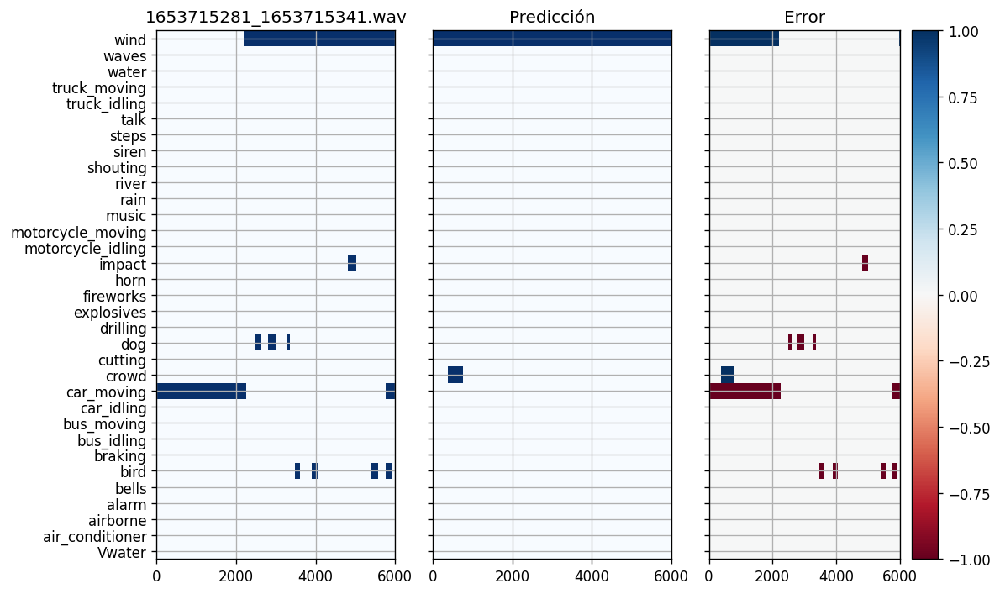

In [2]:
from IPython.display import Audio

def plot_file_prediction(model: int, idx: int, th: float=None):
    if th is not None:
        pred = (preds_soft[model][idx] > th).T#[3:, :]
    
    label = labels[model][idx].T
    fig, ax = plt.subplots(1, 3, figsize=(10, 6), facecolor='w', dpi=120,
                           tight_layout=True, sharex=True, sharey=True)
    ax[0].pcolormesh(label, cmap=plt.cm.Blues, vmin=0, vmax=1)
    ax[1].pcolormesh(pred, cmap=plt.cm.Blues, vmin=0, vmax=1)
    ax[0].set_title(names[model][idx])
    ax[1].set_title('Predicción')
    cmap = ax[2].pcolormesh((pred - label), cmap=plt.cm.RdBu, vmin=-1, vmax=1)
    fig.colorbar(cmap)
    ax[2].set_title('Error')
    ax[0].set_yticks(np.arange(0, len(dataset.categories), step=1) + 0.5)
    ax[0].set_yticklabels((dataset.categories));
    ax[0].grid()
    ax[1].grid()
    ax[2].grid()
    
    return Audio(Path('../datasets/AUMILAB/jak_round1/jak/') / names[model][idx])
    
plot_file_prediction(0, 1, 0.3)
#plot_file_prediction(1, 90, 0.3)